In [1]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from scipy.linalg import solve_banded
from scipy import sparse
import seaborn as sns
import pandas as pd
import os
os.environ["DDE_BACKEND"] = "pytorch" # Export Enviromental variable to use PyTorch
import deepxde as dde
from deepxde.backend import torch

Using backend: pytorch
Other supported backends: tensorflow.compat.v1, tensorflow, jax, paddle.
paddle supports more examples now and is recommended.


# Finite Difference Method

In [2]:
T = 10

n = 200 # Number of points
m = 10000 # Timesteps
y = np.zeros((m, n), dtype=np.cdouble) # Solution array

A = np.zeros((n, n)) # A-matrix
b = np.zeros(n, dtype=np.cdouble) # b-vector

R = np.exp(2-4*np.pi)
G = 1
Q = 1
S = 1
K = 1
mu = 1
f = 4
l1 = Q*S*K*K
l2 =(2-np.log(R))/(4*np.pi*mu)
l0 = (l1*l2/(f))**(1/4)

def analytical_y(G, l0, L, x, t):
    c8 = np.cos(np.pi/8) # 0.92
    s8 = np.sin(np.pi/8) # 0.38
    theta = x*(c8 - 1j*s8)/l0
    phi = L*(c8 - 1j*s8)/l0
    p1 = G*l0*(np.exp(1j*(f*t + np.pi/8)))
    p2 = 1/(2 + 2*np.cosh(phi)*np.cos(phi))
    p3 = np.sin(theta) + np.sinh(theta) + np.sin(phi)*np.cosh(phi-theta) - np.cos(phi)*np.sinh(phi-theta) - np.cosh(phi)*np.sin(phi-theta) + np.sinh(phi)*np.cos(phi-theta)
    return p1*p2*p3

eta = l1*l2
L = 10*l0
x = np.linspace(0, L, n) # Grid
times = np.linspace(0, T, m)
h = L/(n-1) # Grid spacing
dt = T/(m-1)
s = eta*dt/(h**4)
l0, eta

(0.7071067811865476, 1.0)

In [3]:
#y[0] = 0.1*x**4 - 0.4*x**3 
#l = 2
#y[0] = l*(x**4)/4 + l*x**3 - 9*l*x*x/2
#y[0] = 0*x
y[0] = 0*x
al = eta*dt/(h*h*h*h)
b = y[0].copy()
for t in range(1, m):
    Ab = np.zeros((7, n))
    Ab[0, 4:] = al
    Ab[1, 3:-1] = -4*al
    Ab[2, 2:-2] = 6*al + 1
    Ab[3, 1:-3] = -4*al
    Ab[4, :-4] = al
    
    Ab[2, 0] = 1
    
    Ab[3, 0] = -(1.5)/h
    Ab[2, 1] = +(2)/(h)
    Ab[1, 2] = -(0.5)/(h)

    Ab[1, -1] = 2/(h*h)
    Ab[2, -2] = -5/(h*h)
    Ab[3, -3] = 4/(h*h)
    Ab[4, -4] = -1/(h*h)

    Ab[2, -1] = 5/2
    Ab[3, -2] = -9
    Ab[4, -3] = 12
    Ab[5, -4] = -7
    Ab[6, -5] = 3/2
    b = (y[t-1]).copy()
    b[0] = 0
    b[1] = G*np.exp(1j*f*dt*t)

    b[-1] = 0
    b[-2] = 0
    y[t] = solve_banded((4,2), Ab, b)

0.39321130382053626


/home/xwlin/anaconda3/lib/python3.11/site-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
/home/xwlin/anaconda3/lib/python3.11/site-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


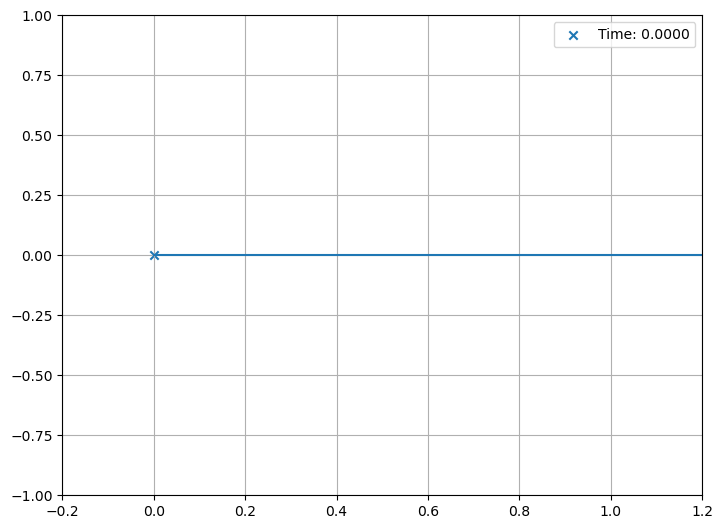

In [4]:
sol2 = y.copy()
print(np.abs(y).max())
fig = plt.figure()
ax = fig.add_axes([0, 0, 1, 1])
ax.set_xlim(-0.2, 1.2)
ax.set_ylim(-1, 1)
ax.grid()
line, = ax.plot(x, y[0])
point = ax.scatter(0, 0, marker='x')
def update(fn):
    line.set_data(x, y[100*fn])
    point.set_label(f'Time: {100*fn*dt:.4f}')
    ax.legend()

animation = FuncAnimation(fig, update, interval=50, save_count=100)
HTML(animation.to_jshtml())

In [5]:
y2 = np.zeros((m, n), dtype=np.cdouble) # Solution array
x = np.linspace(0, L, n) # Grid
for t in range(0, m):
    y2[t] = analytical_y(G=G, l0=l0, L=L, x=x, t=dt*t)

0.35609218652430874


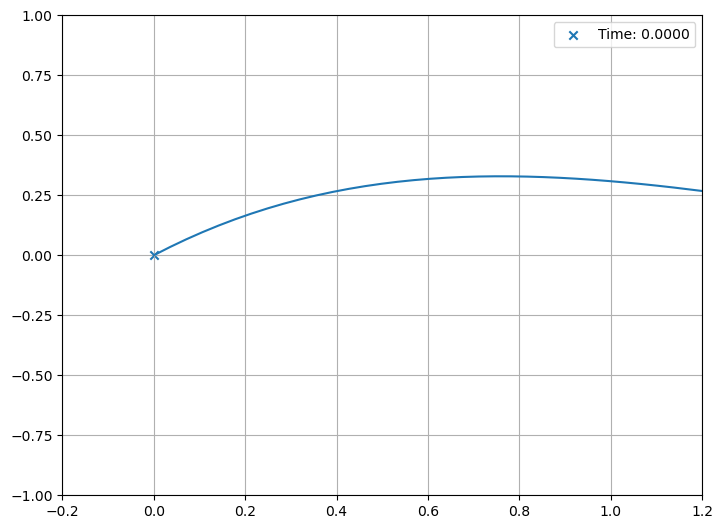

In [6]:
y = np.real(y2)
sol = y.copy()
print(np.abs(y).max())
fig = plt.figure()
ax = fig.add_axes([0, 0, 1, 1])
ax.set_xlim(-0.2, 1.2)
ax.set_ylim(-1, 1)
ax.grid()
line, = ax.plot(x, y[0])
point = ax.scatter(0, 0, marker='x')
def update(fn):
    line.set_data(x, y[100*fn])
    point.set_label(f'Time: {100*fn*dt:.4f}')
    ax.legend()

animation = FuncAnimation(fig, update, interval=50, save_count=100)
HTML(animation.to_jshtml())

/home/xwlin/anaconda3/lib/python3.11/site-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
/home/xwlin/anaconda3/lib/python3.11/site-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


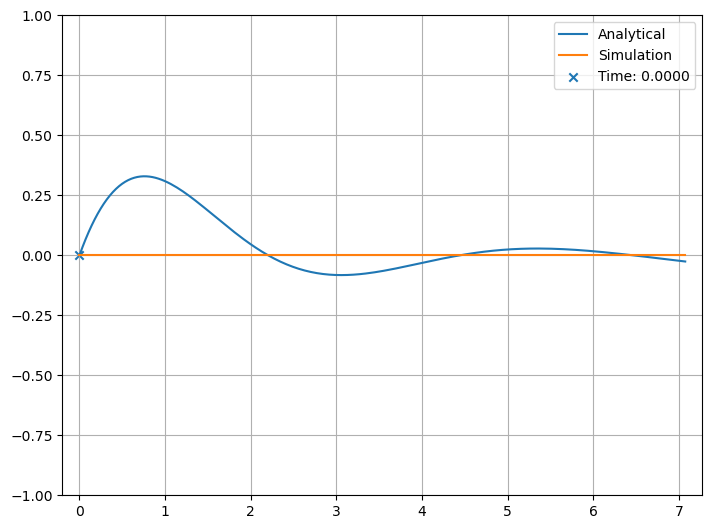

In [7]:
fig = plt.figure()
ax = fig.add_axes([0, 0, 1, 1])
ax.set_xlim(-0.2, L+0.2)
ax.set_ylim(-1, 1)
ax.grid()
line, = ax.plot(x, sol[0], label='Analytical')
line2, = ax.plot(x, sol2[0], label='Simulation')
point = ax.scatter(0, 0, marker='x')
def update(fn):
    line.set_data(x, sol[100*fn])
    line2.set_data(x, sol2[100*fn])
    point.set_label(f'Time: {100*fn*dt:.4f}')
    ax.legend()

animation = FuncAnimation(fig, update, interval=50, save_count=100)
HTML(animation.to_jshtml())

# Heatmap from simulation

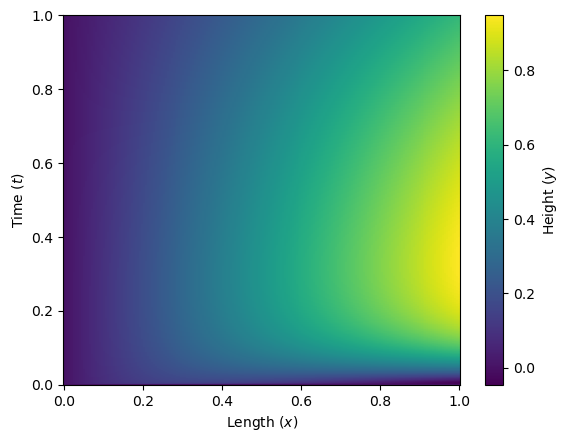

In [8]:
df = pd.read_parquet('./data/eta_1.parquet')
data = df.pivot(index='t', columns='x', values='y')

x_val = data.columns.values
t_val = data.index.values
X, T = np.meshgrid(x_val, t_val)
plt.pcolormesh(X, T, data.values)
plt.xlabel('Length ($x$)')
plt.ylabel('Time ($t$)')
plt.colorbar(label='Height ($y$)')
plt.show()

# $\eta$ on LHS

In [9]:
loss = np.loadtxt('./run1/loss.dat')
loss_df = pd.DataFrame(loss, columns=['step', 'train_pde', 'train_bc1', 'train_bc2', 'train_bc3', 'train_bc4',
                           'train_ic', 'test_pde', 'test_bc1', 'test_bc2', 'test_bc3', 'test_bc4',
                           'test_ic']) # [bc1, bc2, bc3, bc4, ic]
loss_df['train_loss'] = loss_df['train_pde'] + loss_df['train_bc1'] + loss_df['train_bc2'] + loss_df['train_bc3'] + loss_df['train_bc4'] + loss_df['train_ic']

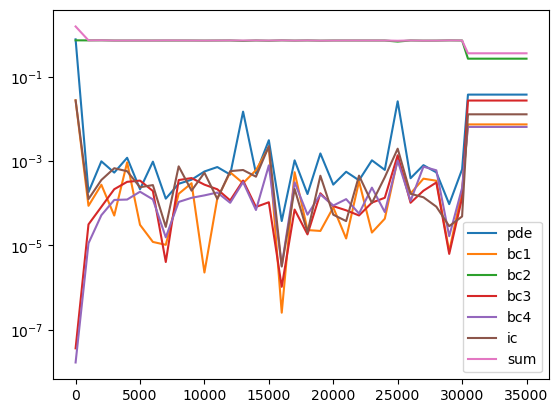

In [10]:
plt.plot(loss_df['step'], loss_df['train_pde'], label='pde')
plt.plot(loss_df['step'], loss_df['train_bc1'], label='bc1')
plt.plot(loss_df['step'], loss_df['train_bc2'], label='bc2')
plt.plot(loss_df['step'], loss_df['train_bc3'], label='bc3')
plt.plot(loss_df['step'], loss_df['train_bc4'], label='bc4')
plt.plot(loss_df['step'], loss_df['train_ic'], label='ic')
plt.plot(loss_df['step'], loss_df['train_loss'], label='sum')
plt.legend()
ax = plt.gca()
ax.set_yscale('log')
plt.show()

In [11]:
geom = dde.geometry.Rectangle([0, 1e-5], [1, 10000]) # X x [\eta]
timedomain = dde.geometry.TimeDomain(0, 1) # T
geomtime = dde.geometry.GeometryXTime(geom, timedomain) # X x [\eta] x T

def pde(x, y):
    """
    PDE residual definition
    x[:, 0:1] - x-variable
    x[:, 1:2] - eta
    x[:, 2:3] - t-variable
    """
    dy_t = dde.grad.jacobian(y, x, i=0, j=2)
    dy_xx = dde.grad.hessian(y, x, i=0, j=0)
    dy_xxxx = dde.grad.hessian(dy_xx, x)
    return (
        x[:, 1:2]*dy_t
        + dy_xxxx
    )

def dy(x, y):
    dy_x = dde.grad.jacobian(y, x, j=0)
    return dy_x

def ddy(x, y):
    return dde.grad.hessian(y, x, i=0, j=0)

def dddy(x, y):
    dy_xx = dde.grad.jacobian(y, x, j=0)
    dy_xxx = dde.grad.hessian(dy_xx, x, j=0)
    return dy_xxx

def boundary_l(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[0], 0)

def boundary_r(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[0], 1)

bc1 = dde.icbc.DirichletBC(geomtime, lambda x: 0, boundary_l)
bc2 = dde.icbc.OperatorBC(geomtime, lambda x, y, _: dy(x, y) - torch.cos(x[:, 2:3]), boundary_l)
bc3 = dde.icbc.OperatorBC(geomtime, lambda x, y, _: ddy(x, y), boundary_r)
bc4 = dde.icbc.OperatorBC(geomtime, lambda x, y, _: dddy(x, y), boundary_r)

ic = dde.icbc.IC(
    geomtime,
    lambda x: 0,
    lambda _, on_initial: on_initial,
)

data = dde.data.TimePDE(
    geomtime,
    pde,
    [bc1, bc2, bc3, bc4, ic],
    num_domain=6000,
    num_boundary=2000,
    num_initial=2000,
    num_test=6000,
)

def load_data(dataset_path):
    """
    Reads parquet files and formats data.
    """
    data = pd.read_parquet(dataset_path)
    y_data = data.pop('y').to_numpy().reshape(-1, 1)
    x_data = data.to_numpy()
    return x_data, y_data



In [12]:
net = dde.nn.FNN([3] + [48] * 4 + [1], "tanh", "Glorot uniform")
model = dde.Model(data, net)
model.compile("L-BFGS")
model.restore(save_path = "./run3/model-14000.pt")
x_test, y_test = load_data('./data/train.parquet')
y_pred = model.predict(x_test)
dde.metrics.l2_relative_error(y_test, y_pred)

Compiling model...
'compile' took 0.000101 s



0.8796581569892513

In [13]:
net = dde.nn.FNN([3] + [48] * 4 + [1], "tanh", "Glorot uniform")
model = dde.Model(data, net)
model.compile("L-BFGS")
model.restore(save_path = "./run1/model-14000.pt")
x_test, y_test = load_data('./data/train_old.parquet')
y_pred = model.predict(x_test)
dde.metrics.l2_relative_error(y_test, y_pred)

Compiling model...
'compile' took 0.000091 s



1.5308813174188267

In [14]:
ts = 1000
xs = 200
eta = 1

t_all = np.linspace(0, 1, ts)
x_all = np.linspace(0, 1, xs)
T, X = np.meshgrid(t_all, x_all, indexing='ij')
T_flat = T.ravel()
X_flat = X.ravel()
ETA_flat = np.full_like(T_flat, eta)

inputs = np.stack([X_flat, ETA_flat, T_flat], axis=-1)
sol_flat = model.predict(inputs)
sol = sol_flat.reshape(ts, xs)

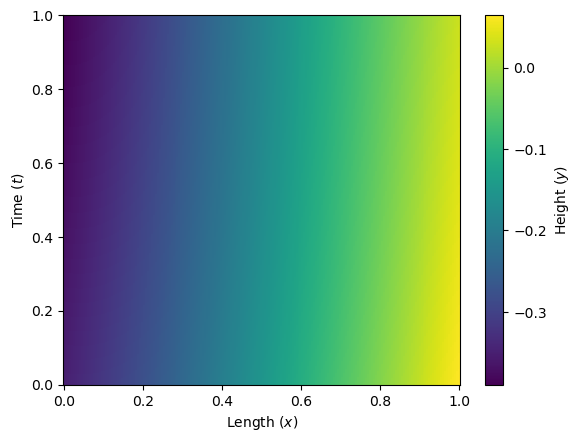

In [15]:
data = pd.DataFrame(sol, columns=x_all, index=t_all)

x_val = data.columns.values
t_val = data.index.values
X, T = np.meshgrid(x_val, t_val)
plt.pcolormesh(X, T, data.values)
plt.xlabel('Length ($x$)')
plt.ylabel('Time ($t$)')
plt.colorbar(label='Height ($y$)')
plt.show()

# PINNs with hard constrains

In [16]:
loss = np.loadtxt('./run10/loss.dat')
loss_df = pd.DataFrame(loss, columns=['step', 'train_pde', 'train_bc2', 'train_bc3', 'train_bc4',
                           'test_pde', 'test_bc2', 'test_bc3', 'test_bc4']) # [bc1, bc2, bc3, bc4, ic]
loss_df['train_loss'] = loss_df['train_pde'] + loss_df['train_bc2'] + loss_df['train_bc3'] + loss_df['train_bc4']

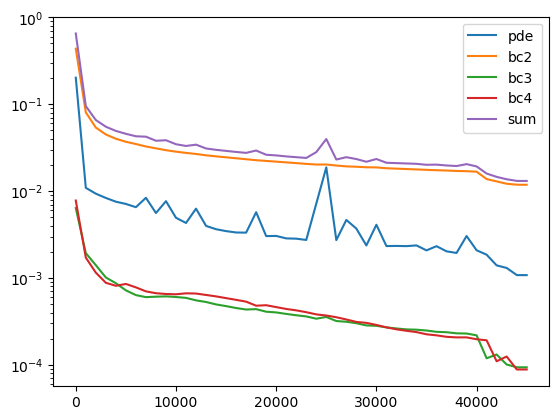

In [17]:
plt.plot(loss_df['step'], loss_df['train_pde'], label='pde')
plt.plot(loss_df['step'], loss_df['train_bc2'], label='bc2')
plt.plot(loss_df['step'], loss_df['train_bc3'], label='bc3')
plt.plot(loss_df['step'], loss_df['train_bc4'], label='bc4')
plt.plot(loss_df['step'], loss_df['train_loss'], label='sum')
plt.legend()
ax = plt.gca()
ax.set_yscale('log')
plt.show()

In [18]:
def output_transform(x, y):
    return x[:, 0:1]*x[:, 2:3]*y
net = dde.nn.FNN([3] + [20] * 4 + [1], "tanh", "Glorot uniform")
net.apply_output_transform(output_transform)
model = dde.Model(data, net)
model.compile("L-BFGS")
model.restore(save_path = "./run10/model-45000.pt")
x_test, y_test = load_data('./data/test.parquet')
y_pred = model.predict(x_test)
dde.metrics.l2_relative_error(y_test, y_pred)

Compiling model...
'compile' took 0.000137 s



0.18470697371079195

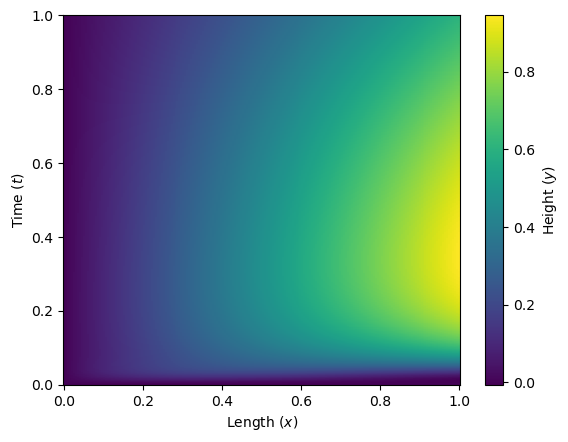

In [19]:
ts = 1000
xs = 200
eta = 1

t_all = np.linspace(0, 1, ts)
x_all = np.linspace(0, 1, xs)
T, X = np.meshgrid(t_all, x_all, indexing='ij')
T_flat = T.ravel()
X_flat = X.ravel()
ETA_flat = np.full_like(T_flat, eta)

inputs = np.stack([X_flat, ETA_flat, T_flat], axis=-1)
sol_flat = model.predict(inputs)
sol = sol_flat.reshape(ts, xs)

data = pd.DataFrame(sol, columns=x_all, index=t_all)

x_val = data.columns.values
t_val = data.index.values
X, T = np.meshgrid(x_val, t_val)
plt.pcolormesh(X, T, data.values)
plt.xlabel('Length ($x$)')
plt.ylabel('Time ($t$)')
plt.colorbar(label='Height ($y$)')
plt.show()

In [20]:
ts = 1000
xs = 200
eta = 1

t_all = np.linspace(0, 1, ts)
x_all = np.linspace(0, 1, xs)
T, X = np.meshgrid(t_all, x_all, indexing='ij')
T_flat = T.ravel()
X_flat = X.ravel()
ETA_flat = np.full_like(T_flat, eta)

inputs = np.stack([X_flat, ETA_flat, T_flat], axis=-1)
sol_flat = model.predict(inputs)
sol = sol_flat.reshape(ts, xs)

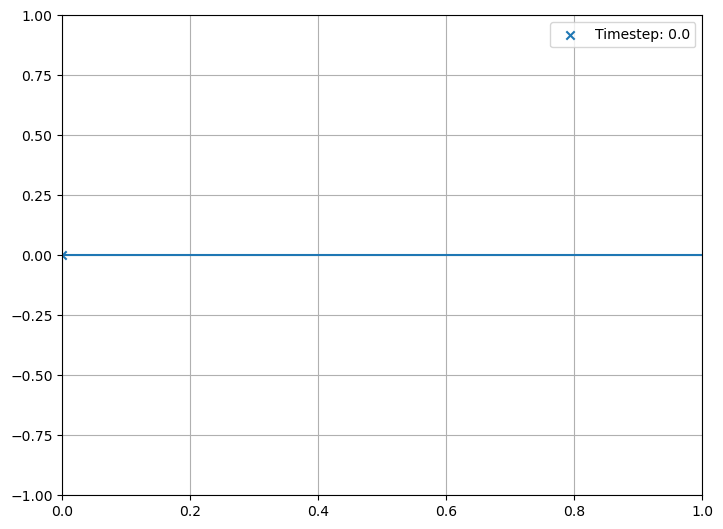

In [21]:
fig = plt.figure()
ax = fig.add_axes([0, 0, 1, 1])
ax.set_xlim(0, 1)
ax.set_ylim(-1, 1)
ax.grid()
line, = ax.plot(x_all, sol[0])
point = ax.scatter(0, 0, marker='x')
def update(fn):
    line.set_data(x_all, sol[10*fn])
    point.set_label(f'Timestep: {t_all[10*fn]}')
    ax.legend()

animation = FuncAnimation(fig, update, interval=50, frames=100)
HTML(animation.to_jshtml())

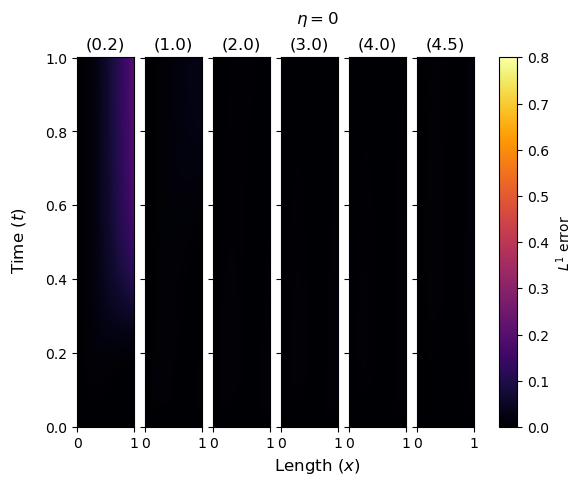

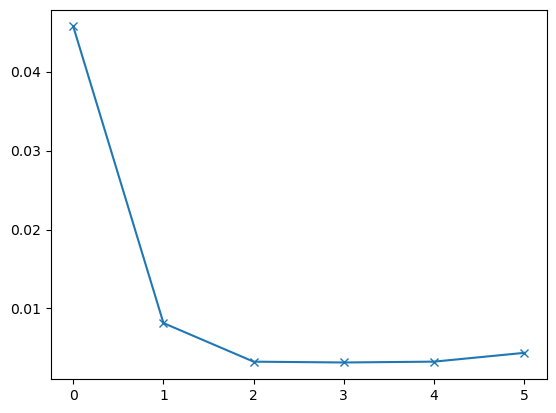

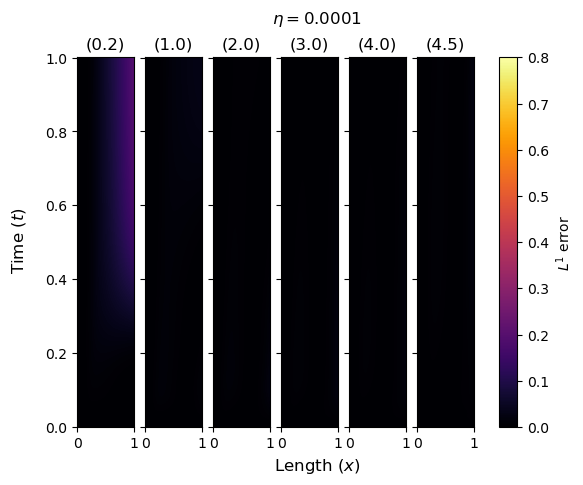

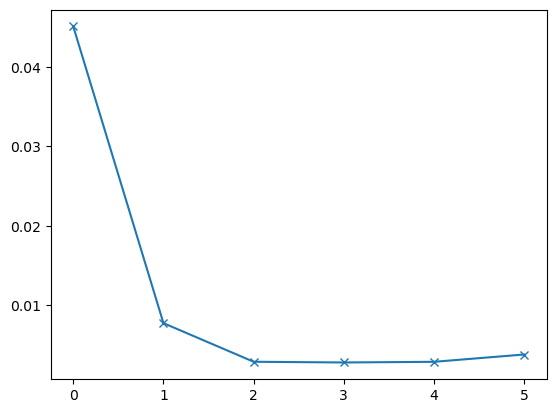

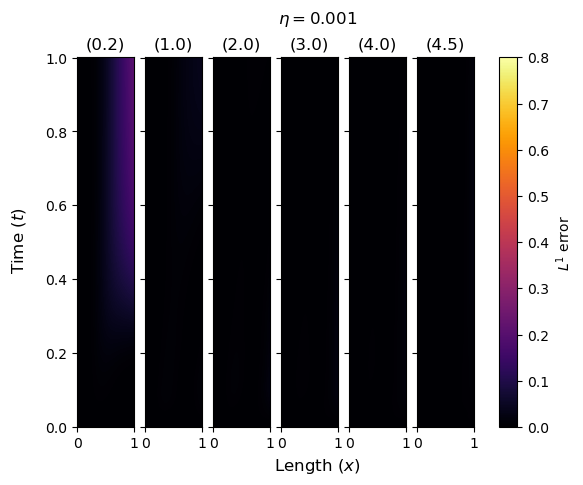

...

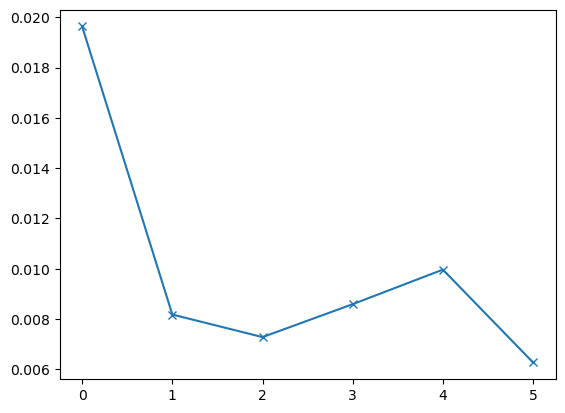

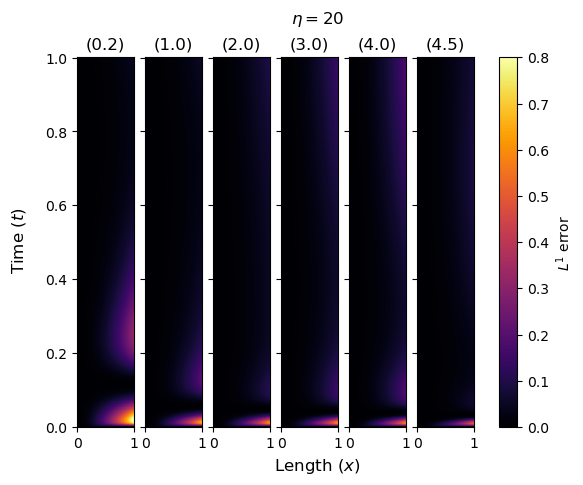

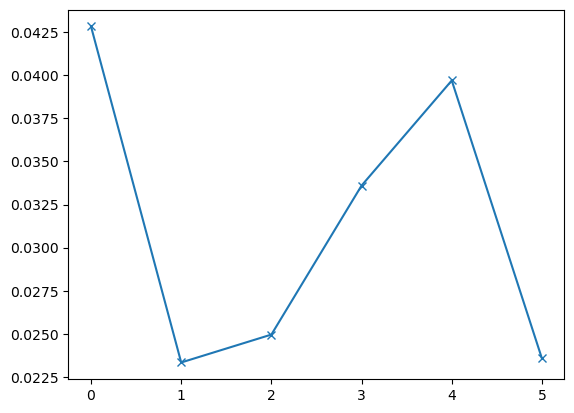

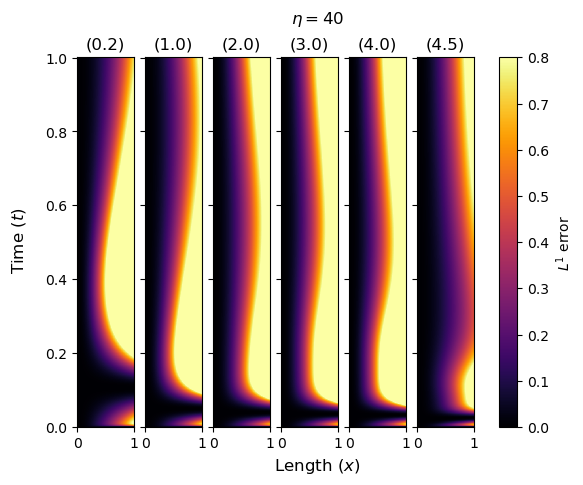

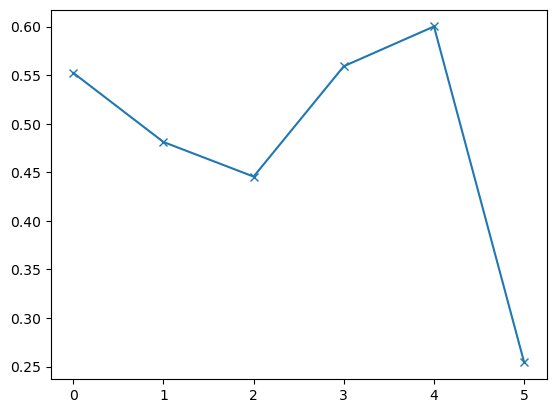

In [22]:
for eta in [0, 0.0001, 0.001, 0.01, 0.1, 1, 5, 10, 15, 20, 40]:
    mses = np.zeros(6)
    f, ax = plt.subplots(1, 6, sharex=True, sharey=True)
    for j, i in enumerate([2000, 10000, 20000, 30000, 40000, 45000]):
        model.restore(save_path = f"./run10/model-{i}.pt")
        ts = 1000
        xs = 200
        eta = eta

        t_all = np.linspace(0, 1, ts)
        x_all = np.linspace(0, 1, xs)
        T, X = np.meshgrid(t_all, x_all, indexing='ij')
        T_flat = T.ravel()
        X_flat = X.ravel()
        ETA_flat = np.full_like(T_flat, eta)

        inputs = np.stack([X_flat, ETA_flat, T_flat], axis=-1)
        sol_flat = model.predict(inputs)
        sol = sol_flat.reshape(ts, xs)

        df = pd.read_parquet(fr'./data/eta_{eta}.parquet')
        data_fd = df.pivot(index='t', columns='x', values='y')

        data = pd.DataFrame(sol, columns=x_all, index=t_all)

        #data = np.abs(data-data_fd)
        x_val = data.columns.values
        t_val = data.index.values
        X, T = np.meshgrid(x_val, t_val)
        diff = np.power(data.values-data_fd.values, 2)
        mses[j] = diff.mean()
        im = ax[j].pcolormesh(X, T, diff, vmin=0, vmax=0.8, cmap='inferno')
        ax[j].set_title(fr'({i/10000})')

    f.supxlabel('Length ($x$)')
    f.supylabel('Time ($t$)')   
    f.colorbar(im, label='$L^1$ error', ax=ax.ravel().tolist())
    f.suptitle(fr'$\eta = {eta}$')
    plt.show()
    plt.plot(mses, marker='x')
    plt.show()

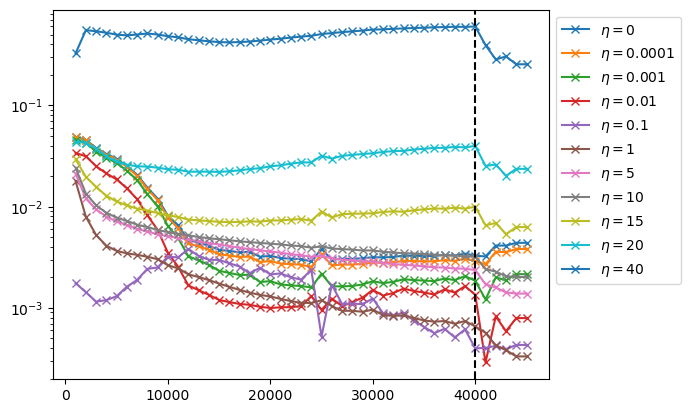

In [23]:
iterations = [1000*x for x in range(1, 46)]
for eta in [0, 0.0001, 0.001, 0.01, 0.1, 1, 5, 10, 15, 20, 40]:
    mses = np.zeros(45)
    for j, i in enumerate(iterations):
        model.restore(save_path = f"./run10/model-{i}.pt")
        ts = 1000
        xs = 200
        eta = eta

        t_all = np.linspace(0, 1, ts)
        x_all = np.linspace(0, 1, xs)
        T, X = np.meshgrid(t_all, x_all, indexing='ij')
        T_flat = T.ravel()
        X_flat = X.ravel()
        ETA_flat = np.full_like(T_flat, eta)

        inputs = np.stack([X_flat, ETA_flat, T_flat], axis=-1)
        sol_flat = model.predict(inputs)
        sol = sol_flat.reshape(ts, xs)

        df = pd.read_parquet(fr'./data/eta_{eta}.parquet')
        data_fd = df.pivot(index='t', columns='x', values='y')

        data = pd.DataFrame(sol, columns=x_all, index=t_all)

        #data = np.abs(data-data_fd)
        x_val = data.columns.values
        t_val = data.index.values
        X, T = np.meshgrid(x_val, t_val)
        diff = np.power(data.values-data_fd.values, 2)
        mses[j] = diff.mean()
    plt.plot(iterations, mses, marker='x', label=fr'$\eta = {eta}$')
plt.legend()
#plt.plot(iterations, 0.8*np.array(iterations)**(-1/2))
ax = plt.gca()
ax.set_yscale('log')
#ax.set_xscale('log')
plt.axvline(40000, ls='--', color='black')
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.show()

In [24]:
iterations = [5000*x for x in range(1, 10)]
etas = [0, 0.0001, 0.001, 0.01, 0.1, 1, 5, 10, 15, 20, 40]
mses = np.zeros((len(etas), 9))
for k, eta in enumerate(etas):
    for j, i in enumerate(iterations):
        model.restore(save_path = f"./run10/model-{i}.pt")
        ts = 1000
        xs = 200
        eta = eta

        t_all = np.linspace(0, 1, ts)
        x_all = np.linspace(0, 1, xs)
        T, X = np.meshgrid(t_all, x_all, indexing='ij')
        T_flat = T.ravel()
        X_flat = X.ravel()
        ETA_flat = np.full_like(T_flat, eta)

        inputs = np.stack([X_flat, ETA_flat, T_flat], axis=-1)
        sol_flat = model.predict(inputs)
        sol = sol_flat.reshape(ts, xs)

        df = pd.read_parquet(fr'./data/eta_{eta}.parquet')
        data_fd = df.pivot(index='t', columns='x', values='y')

        data = pd.DataFrame(sol, columns=x_all, index=t_all)

        #data = np.abs(data-data_fd)
        x_val = data.columns.values
        t_val = data.index.values
        X, T = np.meshgrid(x_val, t_val)
        diff = np.power(data.values-data_fd.values, 2)
        mses[k, j] = diff.mean()

0.045148413853665526


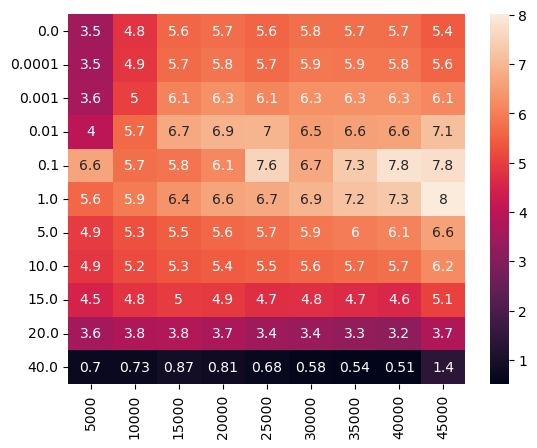

In [25]:
mse_df = pd.DataFrame(mses, index=etas, columns=iterations)
sns.heatmap(-np.log(mse_df), annot=True)
print(mse_df[45000][:20].sum())
plt.show()

# Vanilla PINN

In [26]:
def output_transform(x, y):
    return x[:, 0:1]*x[:, 2:3]*y
net = dde.nn.FNN([3] + [20] * 4 + [1], "tanh", "Glorot uniform")
# net.apply_output_transform(output_transform)
model = dde.Model(data, net)
model.compile("L-BFGS")
iterations = [5000*x for x in range(1, 10)]
etas = [0, 0.0001, 0.001, 0.01, 0.1, 1, 5, 10, 15, 20, 40]
mses = np.zeros((len(etas), 9))
for k, eta in enumerate(etas):
    for j, i in enumerate(iterations):
        model.restore(save_path = f"./run12/model-{i}.pt")
        ts = 1000
        xs = 200
        eta = eta

        t_all = np.linspace(0, 1, ts)
        x_all = np.linspace(0, 1, xs)
        T, X = np.meshgrid(t_all, x_all, indexing='ij')
        T_flat = T.ravel()
        X_flat = X.ravel()
        ETA_flat = np.full_like(T_flat, eta)

        inputs = np.stack([X_flat, ETA_flat, T_flat], axis=-1)
        sol_flat = model.predict(inputs)
        sol = sol_flat.reshape(ts, xs)

        df = pd.read_parquet(fr'./data/eta_{eta}.parquet')
        data_fd = df.pivot(index='t', columns='x', values='y')

        data = pd.DataFrame(sol, columns=x_all, index=t_all)

        #data = np.abs(data-data_fd)
        x_val = data.columns.values
        t_val = data.index.values
        X, T = np.meshgrid(x_val, t_val)
        diff = np.power(data.values-data_fd.values, 2)
        mses[k, j] = diff.mean()

Compiling model...
'compile' took 0.000127 s



0.1829919178224202


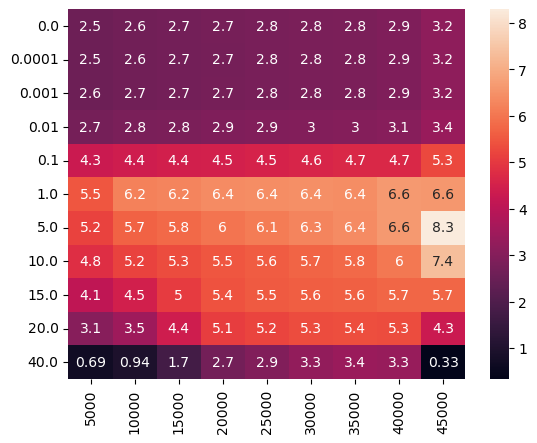

In [27]:
mse_df = pd.DataFrame(mses, index=etas, columns=iterations)
sns.heatmap(-np.log(mse_df), annot=True)
print(mse_df[45000][:20].sum())
plt.show()

In [28]:
ts = 1000
xs = 200
eta = 1

t_all = np.linspace(0, 1, ts)
x_all = np.linspace(0, 1, xs)
T, X = np.meshgrid(t_all, x_all, indexing='ij')
T_flat = T.ravel()
X_flat = X.ravel()
ETA_flat = np.full_like(T_flat, eta)

inputs = np.stack([X_flat, ETA_flat, T_flat], axis=-1)
model.restore(save_path = f"./run12/model-45000.pt")
sol_flat = model.predict(inputs)
sol = sol_flat.reshape(ts, xs)

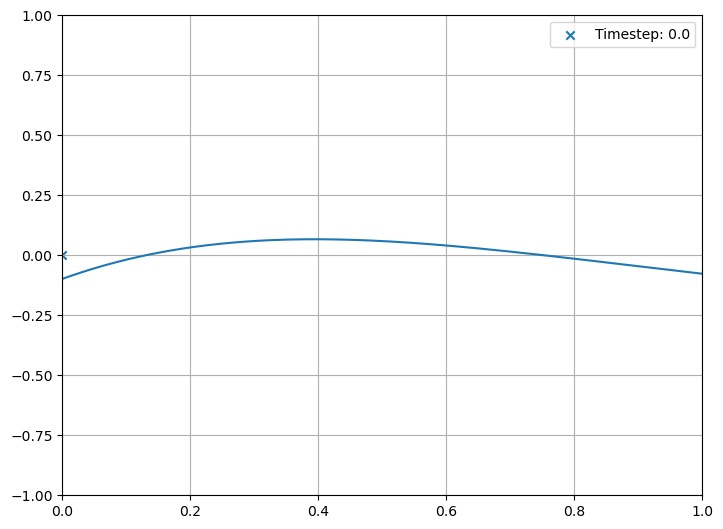

In [29]:
fig = plt.figure()
ax = fig.add_axes([0, 0, 1, 1])
ax.set_xlim(0, 1)
ax.set_ylim(-1, 1)
ax.grid()
line, = ax.plot(x_all, sol[0])
point = ax.scatter(0, 0, marker='x')
def update(fn):
    line.set_data(x_all, sol[10*fn])
    point.set_label(f'Timestep: {t_all[10*fn]}')
    ax.legend()

animation = FuncAnimation(fig, update, interval=50, frames=100)
HTML(animation.to_jshtml())

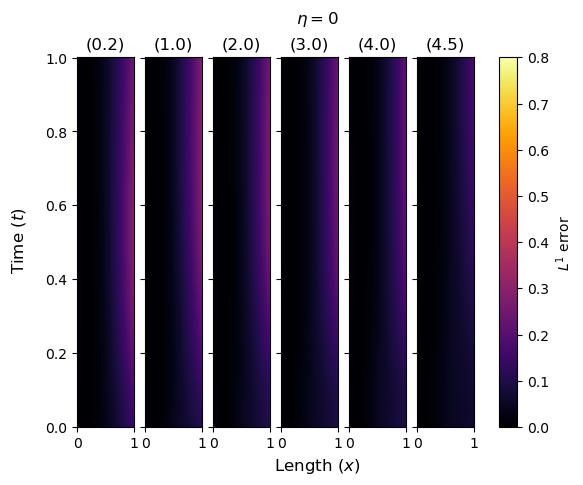

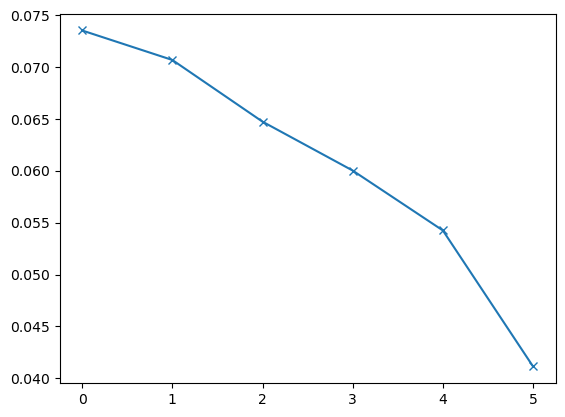

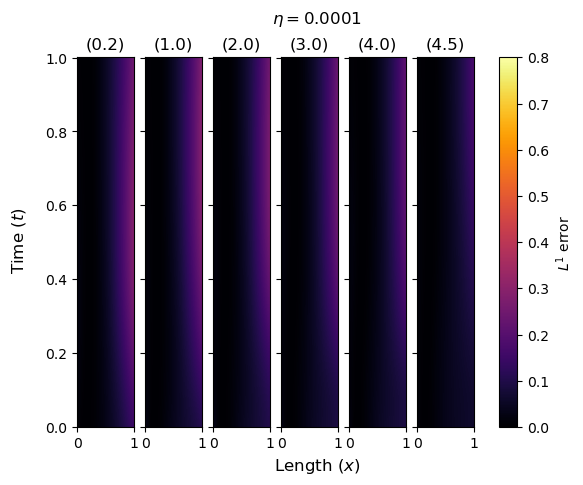

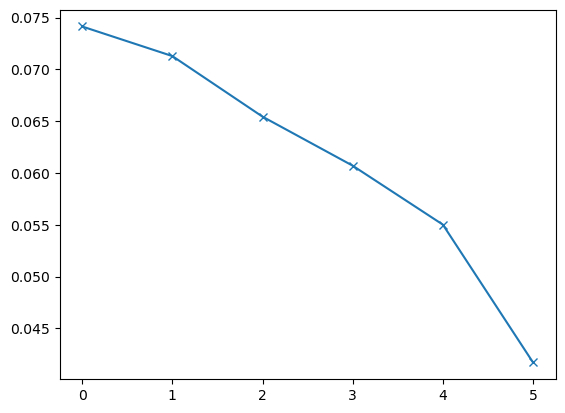

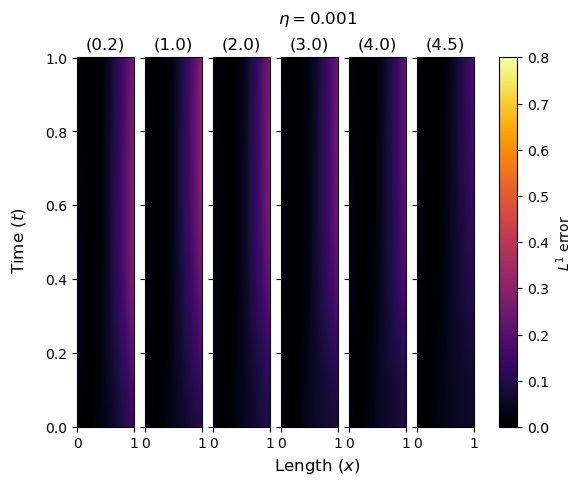

...

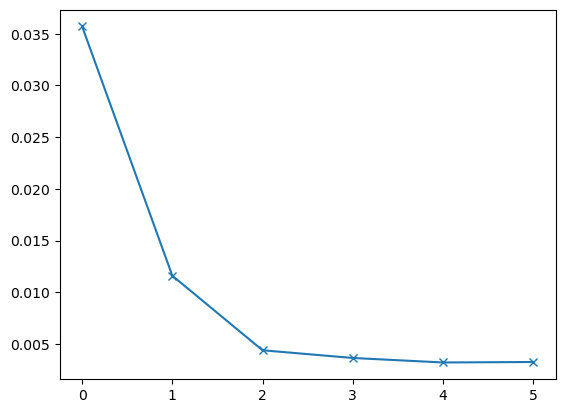

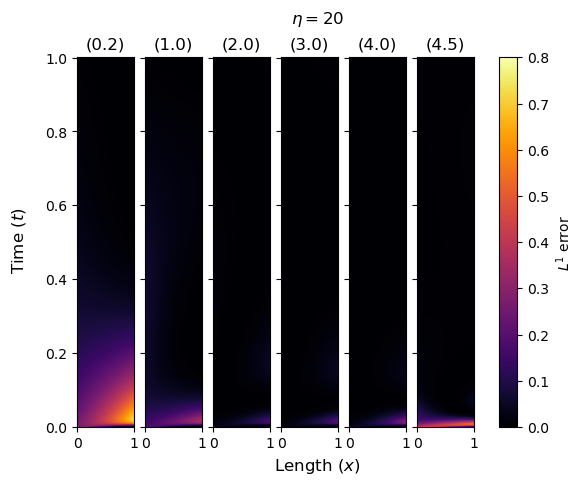

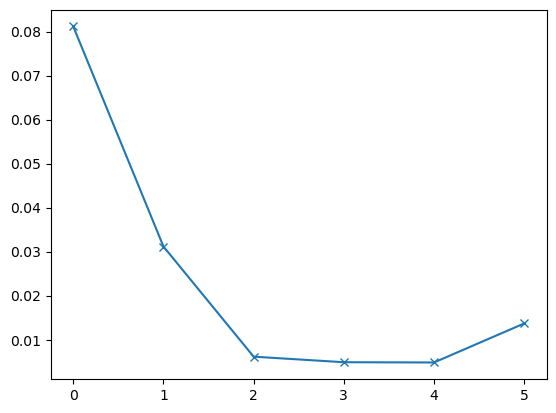

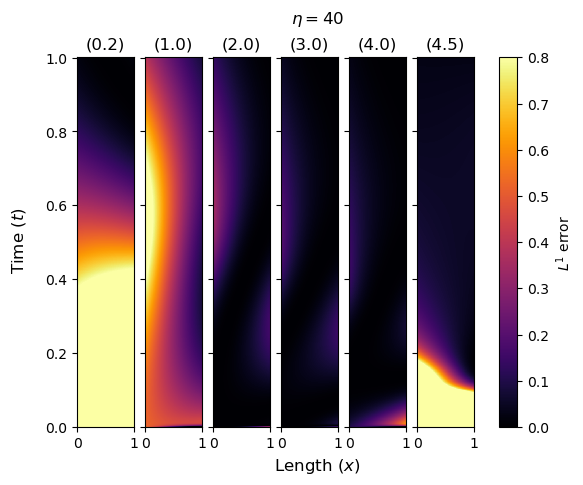

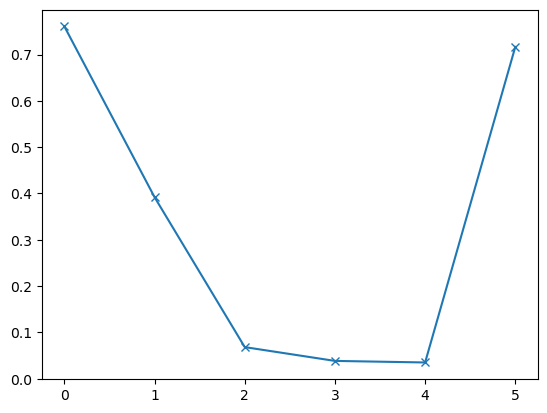

In [30]:
for eta in [0, 0.0001, 0.001, 0.01, 0.1, 1, 5, 10, 15, 20, 40]:
    mses = np.zeros(6)
    f, ax = plt.subplots(1, 6, sharex=True, sharey=True)
    for j, i in enumerate([2000, 10000, 20000, 30000, 40000, 45000]):
        model.restore(save_path = f"./run12/model-{i}.pt")
        ts = 1000
        xs = 200
        eta = eta

        t_all = np.linspace(0, 1, ts)
        x_all = np.linspace(0, 1, xs)
        T, X = np.meshgrid(t_all, x_all, indexing='ij')
        T_flat = T.ravel()
        X_flat = X.ravel()
        ETA_flat = np.full_like(T_flat, eta)

        inputs = np.stack([X_flat, ETA_flat, T_flat], axis=-1)
        sol_flat = model.predict(inputs)
        sol = sol_flat.reshape(ts, xs)

        df = pd.read_parquet(fr'./data/eta_{eta}.parquet')
        data_fd = df.pivot(index='t', columns='x', values='y')

        data = pd.DataFrame(sol, columns=x_all, index=t_all)

        #data = np.abs(data-data_fd)
        x_val = data.columns.values
        t_val = data.index.values
        X, T = np.meshgrid(x_val, t_val)
        diff = np.power(data.values-data_fd.values, 2)
        mses[j] = diff.mean()
        im = ax[j].pcolormesh(X, T, diff, vmin=0, vmax=0.8, cmap='inferno')
        ax[j].set_title(fr'({i/10000})')

    f.supxlabel('Length ($x$)')
    f.supylabel('Time ($t$)')   
    f.colorbar(im, label='$L^1$ error', ax=ax.ravel().tolist())
    f.suptitle(fr'$\eta = {eta}$')
    plt.show()
    plt.plot(mses, marker='x')
    plt.show()

# Comparing differences

Compiling model...
'compile' took 0.000124 s



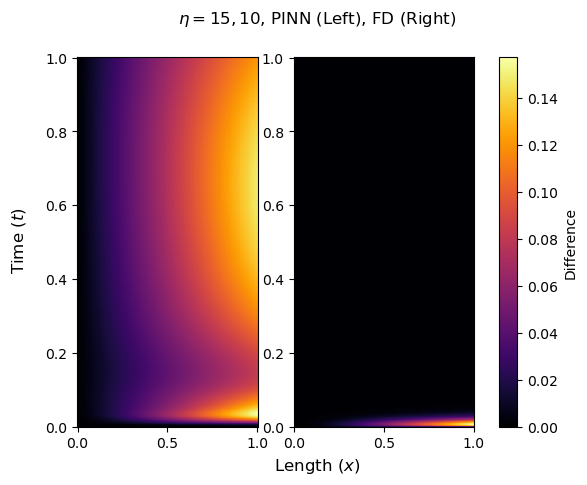

In [31]:
f, ax = plt.subplots(1, 2)
eta_1 = 15
eta_2 = 10
ts = 1000
xs = 200
vmax = None
def output_transform(x, y):
    return x[:, 0:1]*x[:, 2:3]*y
net = dde.nn.FNN([3] + [20] * 4 + [1], "tanh", "Glorot uniform")
net.apply_output_transform(output_transform)
model = dde.Model(data, net)
model.compile("L-BFGS")
model.restore(save_path = "./run10/model-45000.pt")
t_all = np.linspace(0, 1, ts)
x_all = np.linspace(0, 1, xs)
T, X = np.meshgrid(t_all, x_all, indexing='ij')
T_flat = T.ravel()
X_flat = X.ravel()
ETA_flat = np.full_like(T_flat, eta_1)

inputs = np.stack([X_flat, ETA_flat, T_flat], axis=-1)
sol_flat = model.predict(inputs)
sol1 = sol_flat.reshape(ts, xs)

t_all = np.linspace(0, 1, ts)
x_all = np.linspace(0, 1, xs)
T, X = np.meshgrid(t_all, x_all, indexing='ij')
T_flat = T.ravel()
X_flat = X.ravel()
ETA_flat = np.full_like(T_flat, eta_2)

inputs = np.stack([X_flat, ETA_flat, T_flat], axis=-1)
sol_flat = model.predict(inputs)
sol2 = sol_flat.reshape(ts, xs)

data = pd.DataFrame(sol1-sol2, columns=x_all, index=t_all)

x_val = data.columns.values
t_val = data.index.values
X, T = np.meshgrid(x_val, t_val)
ax[0].pcolormesh(X, T, data, vmin=0, vmax=vmax, cmap='inferno')

df = pd.read_parquet(fr'./data/eta_{eta_1}.parquet')
data_fd1 = df.pivot(index='t', columns='x', values='y')
df = pd.read_parquet(fr'./data/eta_{eta_2}.parquet')
data_fd2 = df.pivot(index='t', columns='x', values='y')
x_val = data.columns.values
t_val = data.index.values
X, T = np.meshgrid(x_val, t_val)
im = ax[1].pcolormesh(X, T, data_fd1-data_fd2, vmin=0, vmax=vmax, cmap='inferno')
f.supxlabel('Length ($x$)')
f.supylabel('Time ($t$)')   
f.colorbar(im, label='Difference', ax=ax.ravel().tolist())
f.suptitle(fr'$\eta = {eta_1}, {eta_2}$, PINN (Left), FD (Right)')
plt.show()

# Long time experiment

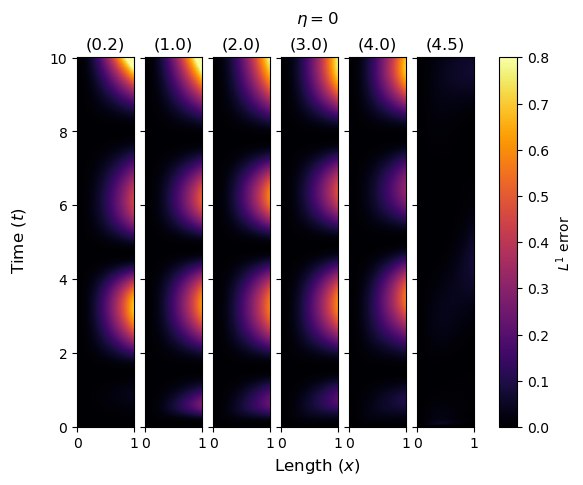

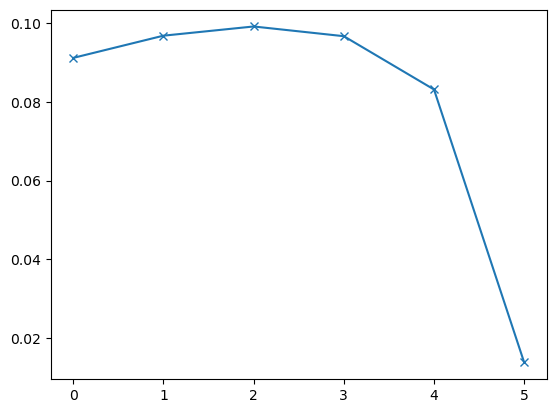

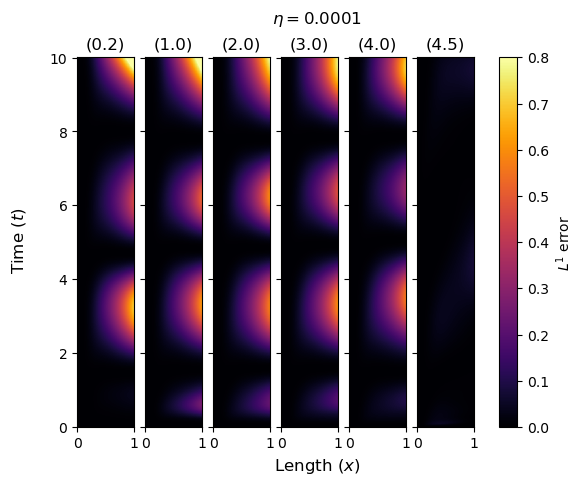

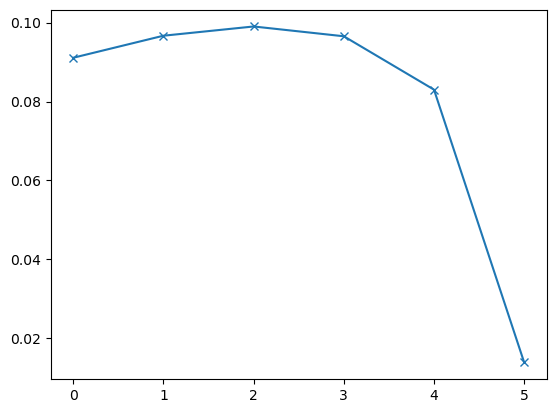

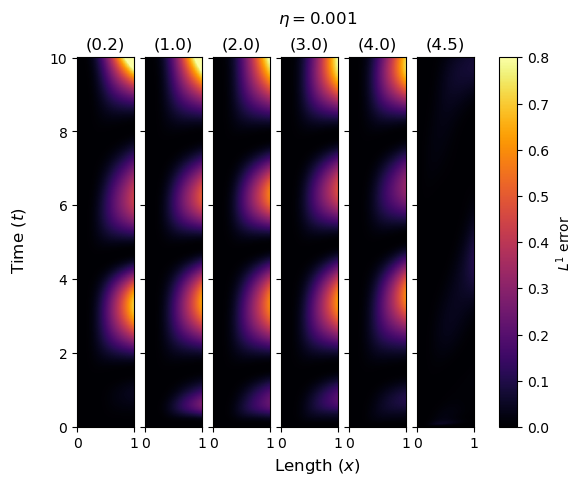

...

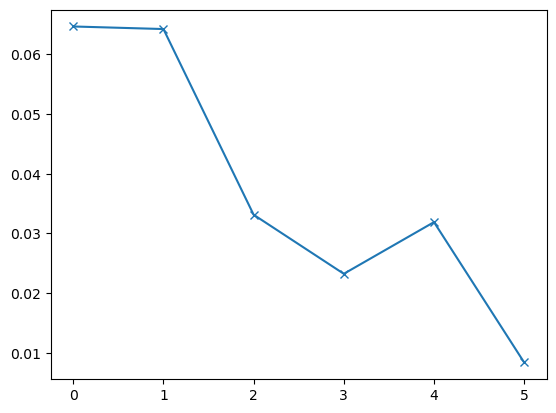

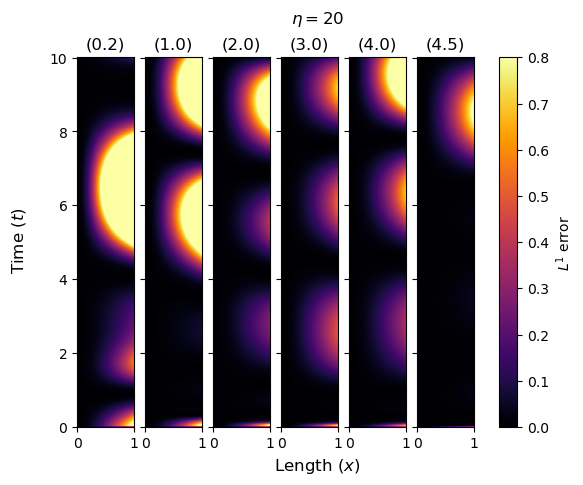

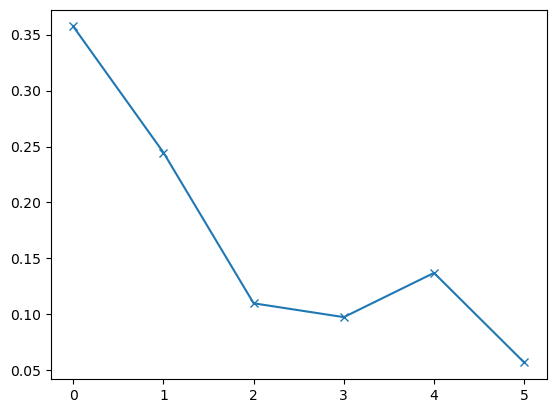

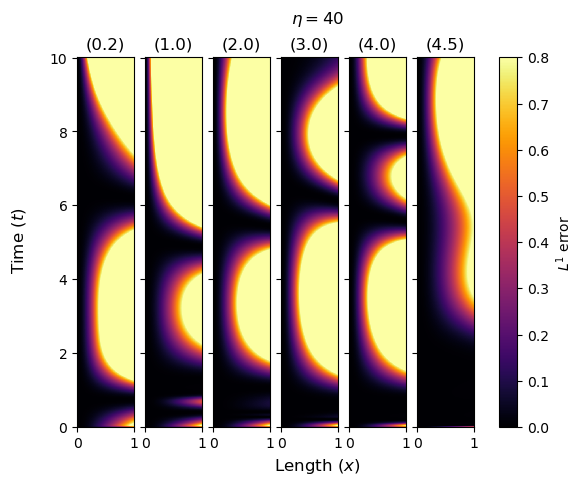

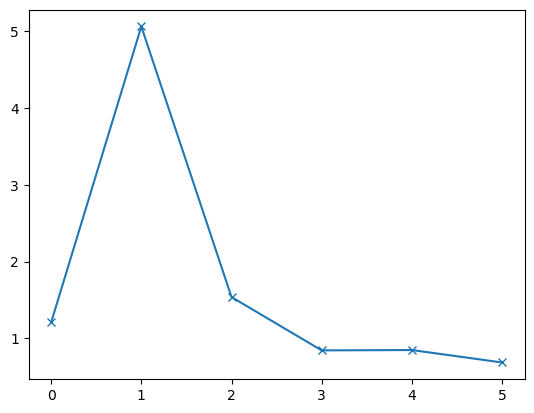

In [32]:
for eta in [0, 0.0001, 0.001, 0.01, 0.1, 1, 5, 10, 15, 20, 40]:
    mses = np.zeros(6)
    f, ax = plt.subplots(1, 6, sharex=True, sharey=True)
    for j, i in enumerate([2000, 10000, 20000, 30000, 40000, 45000]):
        model.restore(save_path = f"./run11/model-{i}.pt")
        ts = 1000
        xs = 200
        eta = eta

        t_all = np.linspace(0, 10, ts)
        x_all = np.linspace(0, 1, xs)
        T, X = np.meshgrid(t_all, x_all, indexing='ij')
        T_flat = T.ravel()
        X_flat = X.ravel()
        ETA_flat = np.full_like(T_flat, eta)

        inputs = np.stack([X_flat, ETA_flat, T_flat], axis=-1)
        sol_flat = model.predict(inputs)
        sol = sol_flat.reshape(ts, xs)

        df = pd.read_parquet(fr'./data/eta_long_{eta}.parquet')
        data_fd = df.pivot(index='t', columns='x', values='y')

        data = pd.DataFrame(sol, columns=x_all, index=t_all)

        #data = np.abs(data-data_fd)
        x_val = data.columns.values
        t_val = data.index.values
        X, T = np.meshgrid(x_val, t_val)
        diff = np.power(data.values-data_fd.values, 2)
        mses[j] = diff.mean()
        im = ax[j].pcolormesh(X, T, diff, vmin=0, vmax=0.8, cmap='inferno')
        ax[j].set_title(fr'({i/10000})')

    f.supxlabel('Length ($x$)')
    f.supylabel('Time ($t$)')   
    f.colorbar(im, label='$L^1$ error', ax=ax.ravel().tolist())
    f.suptitle(fr'$\eta = {eta}$')
    plt.show()
    plt.plot(mses, marker='x')
    plt.show()

In [33]:
iterations = [5000*x for x in range(1, 10)]
etas = [0, 0.0001, 0.001, 0.01, 0.1, 1, 5, 10, 15, 20, 40]
mses = np.zeros((len(etas), 9))
for k, eta in enumerate(etas):
    for j, i in enumerate(iterations):
        model.restore(save_path = f"./run11/model-{i}.pt")
        ts = 1000
        xs = 200
        eta = eta

        t_all = np.linspace(0, 10, ts)
        x_all = np.linspace(0, 1, xs)
        T, X = np.meshgrid(t_all, x_all, indexing='ij')
        T_flat = T.ravel()
        X_flat = X.ravel()
        ETA_flat = np.full_like(T_flat, eta)

        inputs = np.stack([X_flat, ETA_flat, T_flat], axis=-1)
        sol_flat = model.predict(inputs)
        sol = sol_flat.reshape(ts, xs)

        df = pd.read_parquet(fr'./data/eta_long_{eta}.parquet')
        data_fd = df.pivot(index='t', columns='x', values='y')

        data = pd.DataFrame(sol, columns=x_all, index=t_all)

        #data = np.abs(data-data_fd)
        x_val = data.columns.values
        t_val = data.index.values
        X, T = np.meshgrid(x_val, t_val)
        diff = np.power(data.values-data_fd.values, 2)
        mses[k, j] = diff.mean()

0.12674362034496076


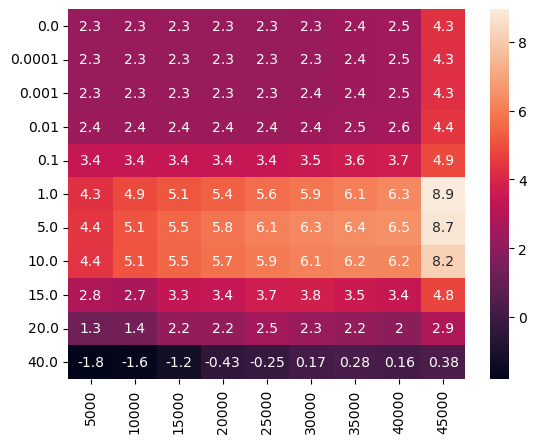

In [34]:
mse_df = pd.DataFrame(mses, index=etas, columns=iterations)
sns.heatmap(-np.log(mse_df), annot=True)
print(mse_df[45000][:20].sum())
plt.show()

In [35]:
ts = 1000
xs = 200
eta = 1

t_all = np.linspace(0, 10, ts)
x_all = np.linspace(0, 1, xs)
T, X = np.meshgrid(t_all, x_all, indexing='ij')
T_flat = T.ravel()
X_flat = X.ravel()
ETA_flat = np.full_like(T_flat, eta)
model.restore(save_path = f"./run11/model-{45000}.pt")
inputs = np.stack([X_flat, ETA_flat, T_flat], axis=-1)
sol_flat = model.predict(inputs)
sol = sol_flat.reshape(ts, xs)

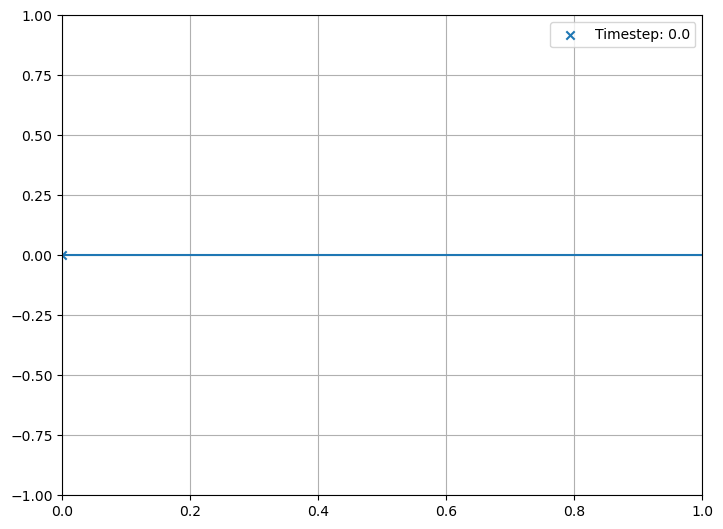

In [36]:
fig = plt.figure()
ax = fig.add_axes([0, 0, 1, 1])
ax.set_xlim(0, 1)
ax.set_ylim(-1, 1)
ax.grid()
line, = ax.plot(x_all, sol[0])
point = ax.scatter(0, 0, marker='x')
def update(fn):
    line.set_data(x_all, sol[10*fn])
    point.set_label(f'Timestep: {t_all[10*fn]}')
    ax.legend()

animation = FuncAnimation(fig, update, interval=50, frames=100)
HTML(animation.to_jshtml())

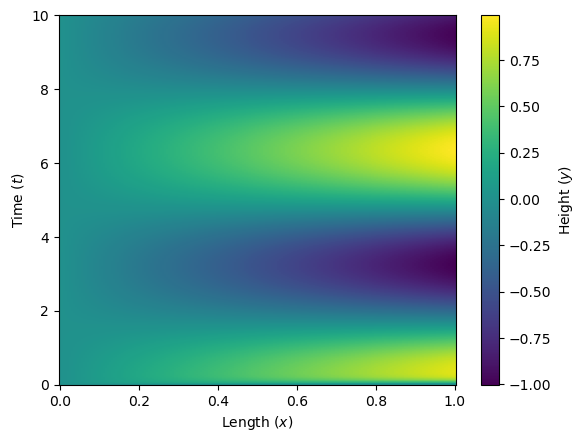

In [37]:
ts = 1000
xs = 200
eta = 1

t_all = np.linspace(0, 10, ts)
x_all = np.linspace(0, 1, xs)
T, X = np.meshgrid(t_all, x_all, indexing='ij')
T_flat = T.ravel()
X_flat = X.ravel()
ETA_flat = np.full_like(T_flat, eta)

inputs = np.stack([X_flat, ETA_flat, T_flat], axis=-1)
sol_flat = model.predict(inputs)
sol = sol_flat.reshape(ts, xs)

data = pd.DataFrame(sol, columns=x_all, index=t_all)

x_val = data.columns.values
t_val = data.index.values
X, T = np.meshgrid(x_val, t_val)
plt.pcolormesh(X, T, data.values)
plt.xlabel('Length ($x$)')
plt.ylabel('Time ($t$)')
plt.colorbar(label='Height ($y$)')
plt.show()

# Long filament extrapolation

In [38]:
ts = 1000
xs = 200
eta = 1

t_all = np.linspace(0, 10, ts)
x_all = np.linspace(0, 1.5, xs)
T, X = np.meshgrid(t_all, x_all, indexing='ij')
T_flat = T.ravel()
X_flat = X.ravel()
ETA_flat = np.full_like(T_flat, eta)
model.restore(save_path = f"./run11/model-{45000}.pt")
inputs = np.stack([X_flat, ETA_flat, T_flat], axis=-1)
sol_flat = model.predict(inputs)
sol = sol_flat.reshape(ts, xs)

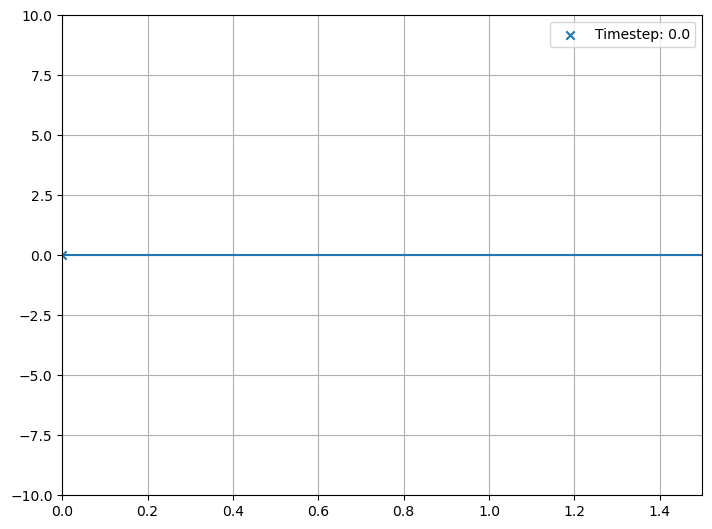

In [39]:
fig = plt.figure()
ax = fig.add_axes([0, 0, 1, 1])
ax.set_xlim(0, 1.5)
ax.set_ylim(-10, 10)
ax.grid()
line, = ax.plot(x_all, sol[0])
point = ax.scatter(0, 0, marker='x')
def update(fn):
    line.set_data(x_all, sol[10*fn])
    point.set_label(f'Timestep: {t_all[10*fn]}')
    ax.legend()

animation = FuncAnimation(fig, update, interval=50, frames=100)
HTML(animation.to_jshtml())

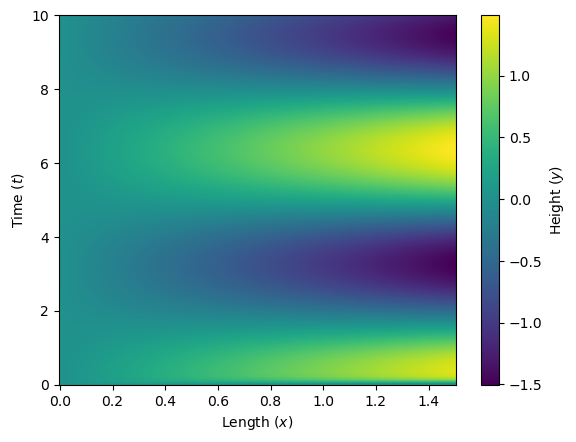

In [40]:
ts = 1000
xs = 200
eta = 1

t_all = np.linspace(0, 10, ts)
x_all = np.linspace(0, 1.5, xs)
T, X = np.meshgrid(t_all, x_all, indexing='ij')
T_flat = T.ravel()
X_flat = X.ravel()
ETA_flat = np.full_like(T_flat, eta)

inputs = np.stack([X_flat, ETA_flat, T_flat], axis=-1)
sol_flat = model.predict(inputs)
sol = sol_flat.reshape(ts, xs)

data = pd.DataFrame(sol, columns=x_all, index=t_all)

x_val = data.columns.values
t_val = data.index.values
X, T = np.meshgrid(x_val, t_val)
plt.pcolormesh(X, T, data.values)
plt.xlabel('Length ($x$)')
plt.ylabel('Time ($t$)')
plt.colorbar(label='Height ($y$)')
plt.show()

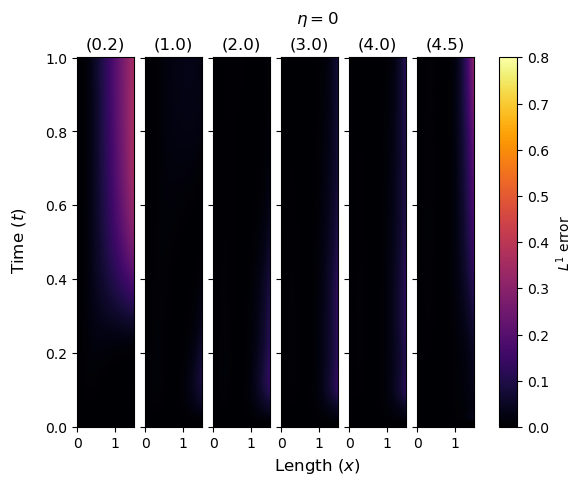

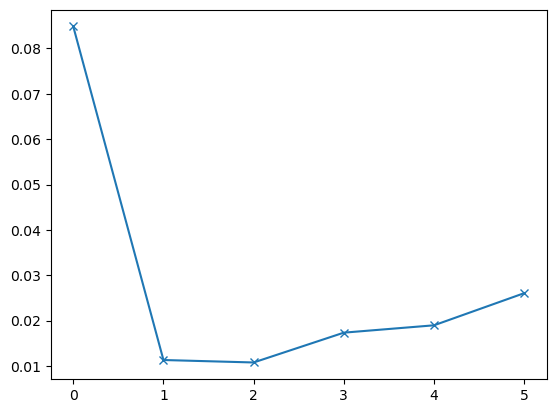

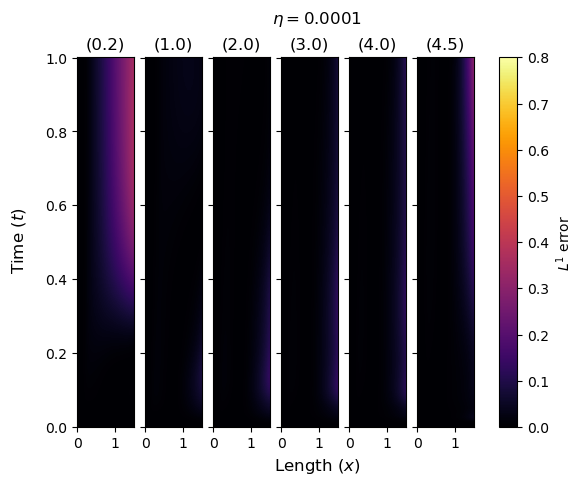

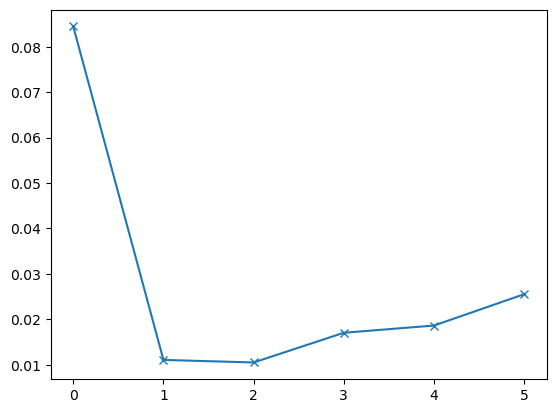

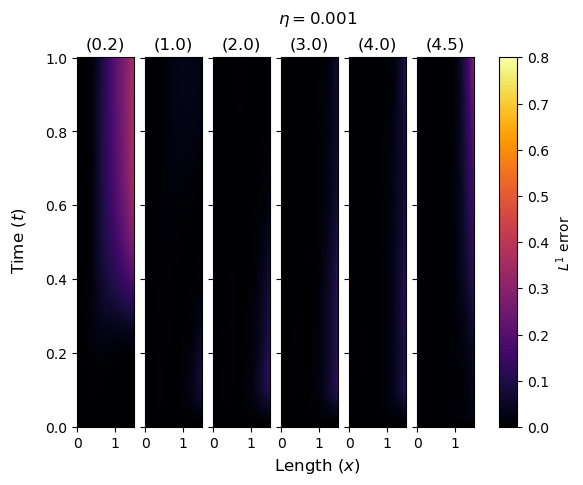

...

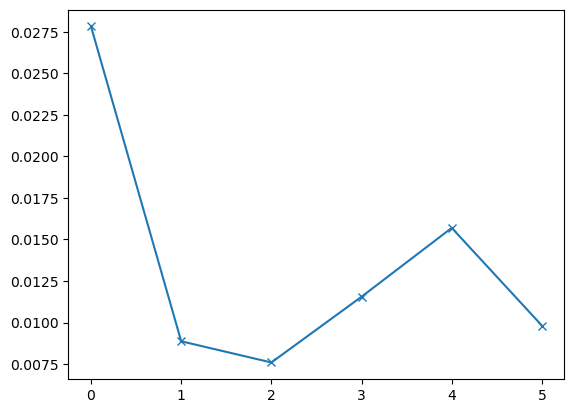

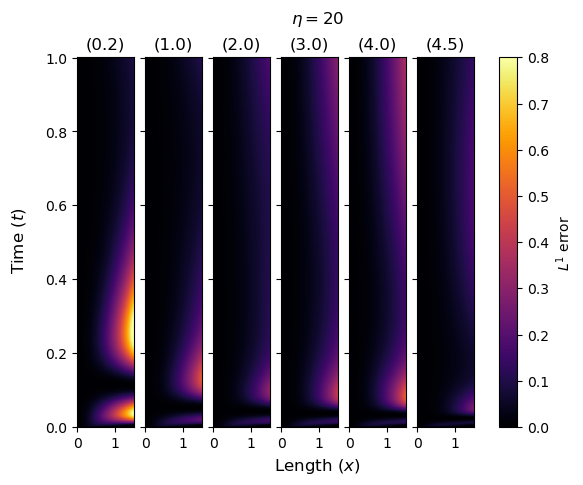

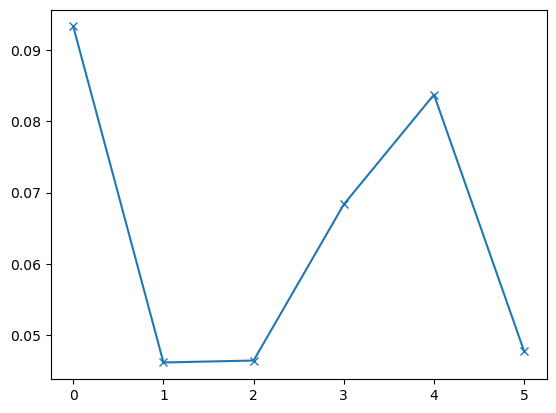

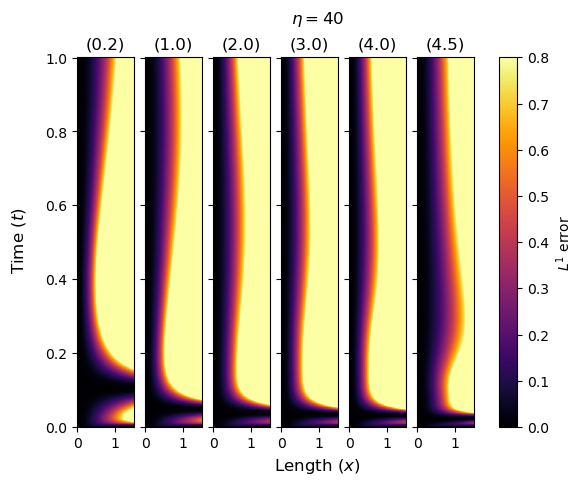

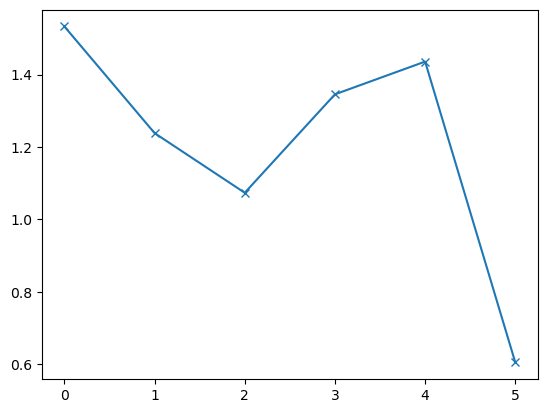

In [41]:
for eta in [0, 0.0001, 0.001, 0.01, 0.1, 1, 5, 10, 15, 20, 40]:
    mses = np.zeros(6)
    f, ax = plt.subplots(1, 6, sharex=True, sharey=True)
    for j, i in enumerate([2000, 10000, 20000, 30000, 40000, 45000]):
        model.restore(save_path = f"./run10/model-{i}.pt")
        ts = 1000
        xs = 200
        eta = eta

        t_all = np.linspace(0, 1, ts)
        x_all = np.linspace(0, 1.5, xs)
        T, X = np.meshgrid(t_all, x_all, indexing='ij')
        T_flat = T.ravel()
        X_flat = X.ravel()
        ETA_flat = np.full_like(T_flat, eta)

        inputs = np.stack([X_flat, ETA_flat, T_flat], axis=-1)
        sol_flat = model.predict(inputs)
        sol = sol_flat.reshape(ts, xs)

        df = pd.read_parquet(fr'./data/filament_1.5_{eta}.parquet')
        data_fd = df.pivot(index='t', columns='x', values='y')

        data = pd.DataFrame(sol, columns=x_all, index=t_all)

        #data = np.abs(data-data_fd)
        x_val = data.columns.values
        t_val = data.index.values
        X, T = np.meshgrid(x_val, t_val)
        diff = np.power(data.values-data_fd.values, 2)
        mses[j] = diff.mean()
        im = ax[j].pcolormesh(X, T, diff, vmin=0, vmax=0.8, cmap='inferno')
        ax[j].set_title(fr'({i/10000})')

    f.supxlabel('Length ($x$)')
    f.supylabel('Time ($t$)')   
    f.colorbar(im, label='$L^1$ error', ax=ax.ravel().tolist())
    f.suptitle(fr'$\eta = {eta}$')
    plt.show()
    plt.plot(mses, marker='x')
    plt.show()

In [42]:
iterations = [5000*x for x in range(1, 10)]
etas = [0, 0.0001, 0.001, 0.01, 0.1, 1, 5, 10, 15, 20, 40]
mses = np.zeros((len(etas), 9))
for k, eta in enumerate(etas):
    for j, i in enumerate(iterations):
        model.restore(save_path = f"./run10/model-{i}.pt")
        ts = 1000
        xs = 200
        eta = eta

        t_all = np.linspace(0, 1, ts)
        x_all = np.linspace(0, 1.5, xs)
        T, X = np.meshgrid(t_all, x_all, indexing='ij')
        T_flat = T.ravel()
        X_flat = X.ravel()
        ETA_flat = np.full_like(T_flat, eta)

        inputs = np.stack([X_flat, ETA_flat, T_flat], axis=-1)
        sol_flat = model.predict(inputs)
        sol = sol_flat.reshape(ts, xs)

        df = pd.read_parquet(fr'./data/filament_1.5_{eta}.parquet')
        data_fd = df.pivot(index='t', columns='x', values='y')

        data = pd.DataFrame(sol, columns=x_all, index=t_all)

        #data = np.abs(data-data_fd)
        x_val = data.columns.values
        t_val = data.index.values
        X, T = np.meshgrid(x_val, t_val)
        diff = np.power(data.values-data_fd.values, 2)
        mses[k, j] = diff.mean()

0.250164164066496


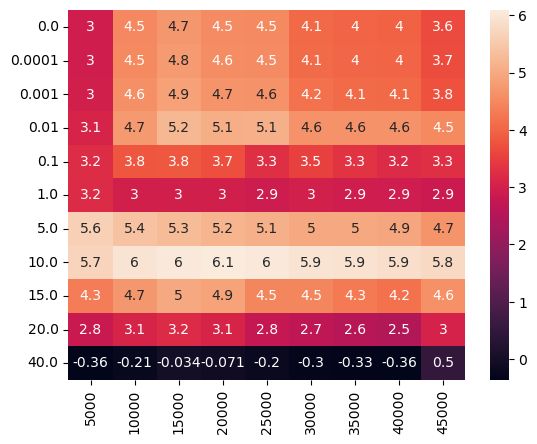

In [43]:
mse_df = pd.DataFrame(mses, index=etas, columns=iterations)
sns.heatmap(-np.log(mse_df), annot=True)
print(mse_df[45000][:20].sum())
plt.show()